# Entrega 6.2

## SEMANA VII – Diagramas dinámicos con más de dos variables
## Despliegue de Soluciones Analíticas – Grupo 18


Integrantes:
- Federico Higuera
- Carlos Sánchez
- Cristian Ospina

## Desarrollo

El entregable de esta semana incluye **1** archivo de Jupyter en **2** formatos. En formato PDF para facilitar la calificación y en .ipynb para la revisión del código. 

A lo largo de este archivo se encuentran todos los pasos necesarios para cumplir con el entregable: 

- Crear un diagrama dinámico. En esta ocasión solo es necesario entregar dos capturas de pantalla. 

- Dos imágenes y textos con explicaciones

También se incluye un archivo de python (.py) que contiene una aplicación web desarrollada en **Streamlit**. Esta aplicación muestra las visualizaciones aquí presentadas de manera interactiva para el posible usuario final.  

Finalmente un enlace al video de demostración de esa aplicación. 
- https://drive.google.com/file/d/1Chh9JkFujsdcZ0nMwACJgWSo5txDwTjX/view?usp=sharing

## Importar librerias


En primer lugar, importamos todos las dependencias a utilizar dentro de esta actividad

In [17]:
# Importar librerias para manejo de datos
import pandas as pd 

# Importar librerías para gráficos
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px

# Importar librerías lectura de Parquets
from glob import glob

# Importar librerías para Mapas
import folium
from folium.plugins import HeatMap

## Cargar Datos del ETL

Cargamos la información del ETL realizado en ejercicios anteriores, estos datos están distribuidos en 39 parquets dentro de la carpeta Parquets

In [18]:
files =  sorted(glob('Parquets/part*')) # Lista de archivos

data = pd.read_parquet(files[0]) # Cargamos el primer archivo
for f in files[1:]:
    data = pd.concat([data, pd.read_parquet(f)]) # Concatenamos los archivos con el primer archivo

data['DATE'] = pd.to_datetime(data['DATE'])  # Convertirmos la fecha a su tipo de dato

La tabla de datos proveniente del ETL de semanas anteriores tiene las siguientes columnas

In [19]:
data.columns

Index(['tripduration', 'starttime', 'stoptime', 'start_bike_station_id',
       'start_bike_station_name', 'start_bike_station_latitude',
       'start_bike_station_longitude', 'end_bike_station_id',
       'end_bike_station_name', 'end_bike_station_latitude',
       'end_bike_station_longitude', 'bikeid', 'usertype', 'birth_year',
       'gender', 'id', 'start_date', 'start_time', 'end_date', 'end_time',
       'end_weather_station_id', 'bk_st_lat', 'bk_st_long',
       'END_WEATHER_STATION_NAME_JOIN', 'END_WEATHER_STATION_JOIN',
       'st_lat_weather_end', 'st_lon_weather_end', 'POI_NAME', 'poi_lat',
       'poi_lon', 'Weather_Station', 'NAME', 'LATITUDE', 'LONGITUDE',
       'ELEVATION', 'DATE', 'PRCP', 'PRCP_ATTRIBUTES', 'TMAX', 'TMIN', 'TAVG',
       'Month', 'Year'],
      dtype='object')

El tamaño de la tabla de datos es

In [20]:
print('El Set de datos tiene {} filas y {} columnas'.format(data.shape[0], data.shape[1]))

El Set de datos tiene 250057 filas y 43 columnas


## Preparación de datos

Seleccionamos la información relevante para realizar las visualizaciones

In [21]:
# selecto only specific columns
data = data[['tripduration', 'starttime', 'stoptime',
       'start_bike_station_id','start_bike_station_name', 'start_bike_station_latitude','start_bike_station_longitude',
       'end_bike_station_id','end_bike_station_name', 'end_bike_station_latitude', 'end_bike_station_longitude',
       'bikeid', 'usertype', 'birth_year','gender',
       'end_date', 'end_time','POI_NAME',
       'Weather_Station', 'NAME', 'LATITUDE', 'LONGITUDE',
       'ELEVATION', 'DATE', 'PRCP',
       'TMAX', 'TMIN', 'TAVG',
       'Month', 'Year']]

Obtenemos el número de minutos que tomo cada viaje

In [22]:
data['tripminutes'] = data.tripduration/60 # Creamos una columna con la duración del viaje en minutos

Obtenemos el número de la semana de la columna fecha que tenemos disponible

In [23]:
data['Semana'] = data.DATE.dt.isocalendar().week

 Intercambiamos la codificación de los géneros a texto descriptivo

In [24]:
data['genero'] = data.gender.replace({0:'Indefinido', 1:'Masculino', 2:'Femenino'})

Obtenemos la edad que tenia cada usuario al momento de hacer el viaje a partir de la columna birth_year y starttime

In [25]:
data['Edad'] = pd.to_datetime(data['starttime']).dt.year - data['birth_year']

A continuación mostramos un ejemplo visual de la tabla

In [26]:
data.sample(5)

,tripduration,starttime,stoptime,start_bike_station_id,start_bike_station_name,start_bike_station_latitude,start_bike_station_longitude,end_bike_station_id,end_bike_station_name,end_bike_station_latitude,...,PRCP,TMAX,TMIN,TAVG,Month,Year,tripminutes,Semana,genero,Edad
7252,701.0,2013-09-05 19:14:37,2013-09-05 19:26:18,153,E 40 St & 5 Ave,40.752062,-73.981632,495.0,W 47 St & 10 Ave,40.762699,...,0.0,26.7,17.8,22.25,09,2013,11.683333,36,Masculino,51
6847,353.0,2013-09-04 12:33:52,2013-09-04 12:39:45,444,Broadway & W 24 St,40.742354,-73.989151,475.0,E 16 St & Irving Pl,40.735243,...,0.0,27.8,18.3,23.05,09,2013,5.883333,36,Masculino,45
3016,500.0,2013-09-01 22:16:05,2013-09-01 22:24:25,137,E 56 St & Madison Ave,40.761628,-73.972924,498.0,Broadway & W 32 St,40.748549,...,0.0,28.9,23.9,26.40,09,2013,8.333333,35,Femenino,34
2852,817.0,2013-09-05 15:35:21,2013-09-05 15:48:58,477,W 41 St & 8 Ave,40.756405,-73.990026,446.0,W 24 St & 7 Ave,40.744876,...,0.0,26.7,17.8,22.25,09,2013,13.616667,36,Indefinido,44
262,741.0,2013-09-01 09:29:33,2013-09-01 09:41:54,521,8 Ave & W 31 St,40.750450,-73.994811,284.0,Greenwich Ave & 8 Ave,40.739017,...,0.0,28.9,23.9,26.40,09,2013,12.350000,35,Masculino,32


## Insights

### Con la anterior columna creada podemos ver cómo es la **distribución de los viajes por edades de los usuarios de City BIkes**.

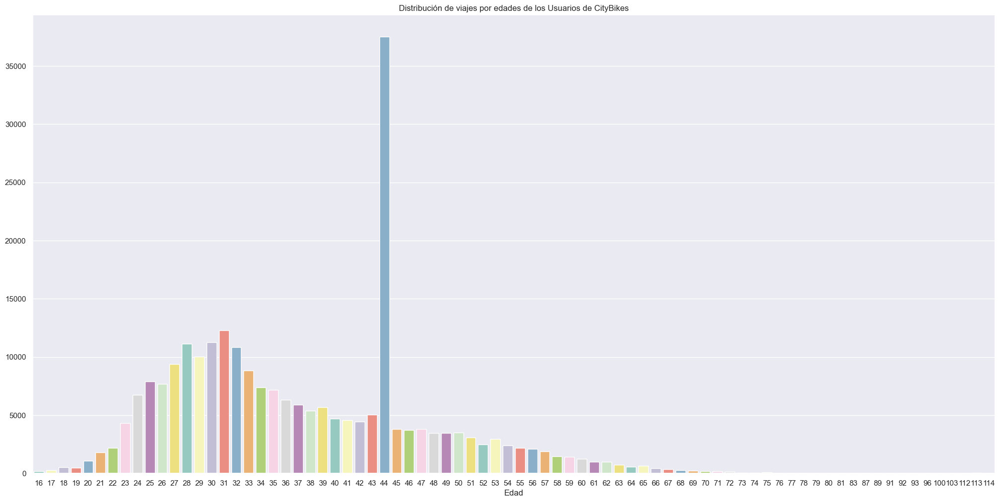

In [27]:
sns.countplot(x="Edad", data=data, palette="Set3")
plt.title('Distribución de viajes por edades de los Usuarios de CityBikes')
plt.ylabel('')
sns.set(rc = {'figure.figsize':(25,12)})
sns.plotting_context("notebook", font_scale=3, rc={"lines.linewidth": 2.5})
plt.show()

### A partir de esta grafica podemos ver que **las personas que mas realizan viajes en CityBikes son personas entre los 24 y 39 años.** Sin embargo, vemos un **gran numero de viajes para personas de 44 años.**

De esta manera podemos filtrar a los viajes en bicicleta por los tipos de usuario que usaron el equipo.

Por ejemplo, podemos ver una muestra de 7 viajes de usuarios que tenían 90 o más años al momento de iniciar su viaje. 

In [28]:
data[data.Edad>=90].sample(7)  # Se toma una muestra de 7 filas de un total de 105. 

,tripduration,starttime,stoptime,start_bike_station_id,start_bike_station_name,start_bike_station_latitude,start_bike_station_longitude,end_bike_station_id,end_bike_station_name,end_bike_station_latitude,...,PRCP,TMAX,TMIN,TAVG,Month,Year,tripminutes,Semana,genero,Edad
2748,1479.0,2013-09-04 15:19:52,2013-09-04 15:44:31,437,Macon St & Nostrand Ave,40.680983,-73.950048,443.0,Bedford Ave & S 9th St,40.708531,...,0.0,27.8,18.3,23.05,09,2013,24.650000,36,Femenino,114
701,623.0,2013-09-05 15:32:15,2013-09-05 15:42:38,521,8 Ave & W 31 St,40.750450,-73.994811,173.0,Broadway & W 49 St,40.760647,...,0.0,26.7,17.8,22.25,09,2013,10.383333,36,Femenino,114
5455,708.0,2013-09-08 16:46:20,2013-09-08 16:58:08,411,E 6 St & Avenue D,40.722281,-73.976687,439.0,E 4 St & 2 Ave,40.726281,...,0.0,28.3,17.8,23.05,09,2013,11.800000,36,Masculino,92
3192,692.0,2013-09-05 12:21:53,2013-09-05 12:33:25,173,Broadway & W 49 St,40.760647,-73.984427,478.0,11 Ave & W 41 St,40.760301,...,0.0,26.7,17.8,22.25,09,2013,11.533333,36,Masculino,96
3883,1223.0,2013-09-08 13:43:40,2013-09-08 14:04:03,249,Harrison St & Hudson St,40.718710,-74.009001,428.0,E 3 St & 1 Ave,40.724677,...,0.0,28.3,17.8,23.05,09,2013,20.383333,36,Masculino,113
7485,967.0,2013-09-03 18:42:04,2013-09-03 18:58:11,422,W 59 St & 10 Ave,40.770513,-73.988038,440.0,E 45 St & 3 Ave,40.752554,...,0.8,27.8,20.0,23.90,09,2013,16.116667,36,Masculino,96
2230,1737.0,2013-09-04 19:00:10,2013-09-04 19:29:07,475,E 16 St & Irving Pl,40.735243,-73.987586,481.0,S 3 St & Bedford Ave,40.712605,...,0.0,27.8,18.3,23.05,09,2013,28.950000,36,Masculino,112


## Visualizaciones interactivas

### A continuación vamos a ver la **cantidad de viajes por tipo de usuario [Suscriptor, miembro, casual o cliente], y por género**.
 

### En esta gráfica es posible utilizar el mouse para obtener detalles de cada elemento.

In [29]:
fig = px.histogram(data, x='usertype', color='genero',barmode='group')
fig.update_xaxes(title_text='Tipo de Usuario')
fig.update_yaxes(title_text='Cantidad de Viajes')
fig.show()

fig = px.histogram(data, x='genero', color='usertype',barmode='group')
fig.update_yaxes(title_text='Cantidad de Viajes')
fig.show()

### En la figura anterior podemos evidenciar que los viajes de los usuarios de tipo suscriptor son mayoritariamente hechos por hombres (151.941K), mientras que los viajes de los usuarios de tipo cliente son mayoritariamente hechos por mujeres (46.444k).
### Sin embargo, los viajes de las mujeres suscriptoras (51.601K) son más que aquellos de las mujeres clientes (46.444k). 

### Los usuarios tipo miembro y casuales hacen muy pocos viajes en comparación con los otros 2 tipos. Aquí es importante recordar que estos datos vienen de un ETL que no necesariamente se hizo con el propósito de analizar los tipos de usuario, por lo que los registros de estos tipos pudieron ser recortados en el proceso. 

### Podemos afirmar que los hombres son los que hacen la mayor cantidad de viajes, mientras que los de género indefinido realizan la menor cantidad de viajes. No obstante, esto puede estar sesgado por el número de hombres, mujeres y género indefinido que utilizan bicicleta en New York.

### Ahora veremos un **mapa en el que podemos filtra por edad**. Python recolectará la edad inferior en la cual se quiere hacer el filtro.

In [30]:
# recolectar input del usuario
try:
    edad_input = int(input("Ingrese su edad: "))
except ValueError:
    print("Debe ingresar un número entero")
    edad_input = 0 

In [31]:
print('\n')
print("El mapa mostrará viajes en bicicleta de personas mayores o igual a ", edad_input)
print('\n')

# Crear dataset filtrado por edad
filtered_data_maps = data[data.Edad>=edad_input]

# Calcular el centro del mapa
mean_lat = filtered_data_maps['start_bike_station_latitude'].mean()
mean_lon = filtered_data_maps['start_bike_station_longitude'].mean()




El mapa mostrará viajes en bicicleta de personas mayores o igual a  65




In [32]:
# Crear mapa
m = folium.Map(location=[mean_lat, mean_lon], zoom_start=12)

# add heatmap to map
HeatMap(data = filtered_data_maps[['start_bike_station_latitude','start_bike_station_longitude']].values.tolist(), radius=12).add_to(m)

print('\n')
print("Mapa de calor de la cantidad de Usuarios de CityBikes para personas mayores de", edad_input, "años")
print('\n')

m




Mapa de calor de la cantidad de Usuarios de CityBikes para personas mayores de 65 años




### Si se escoge como filtro de edad 65 años, se muestra el mapa de calor con la densidade de viajes de personas mayores de 65 años. Analizando la figura podemos ver este tipo de usuarios frecuenta el Union Square y la zona aledaña al puente de Brooklyn.